In [1]:
import os
import cv2
import re
from nltk.tokenize import word_tokenize
import numpy as np
import pandas as pd
from PIL import Image
import torch
import pickle
import fasttext
import torchvision.transforms as transforms

In [2]:
path = "CUB_200/text_c10/"

In [3]:
folders = os.listdir(path)

In [11]:
os.rename('image/new', 'image/image')

In [4]:
for i in folders:
    os.rename(path+i, path+i.split('.')[1].replace('_', ' '))

In [6]:
folders

['Acadian Flycatcher',
 'American Crow',
 'American Goldfinch',
 'American Pipit',
 'American Redstart',
 'American Three toed Woodpecker',
 'Anna Hummingbird',
 'Artic Tern',
 'Baird Sparrow',
 'Baltimore Oriole',
 'Bank Swallow',
 'Barn Swallow',
 'Bay breasted Warbler',
 'Belted Kingfisher',
 'Bewick Wren',
 'Black and white Warbler',
 'Black billed Cuckoo',
 'Black capped Vireo',
 'Black footed Albatross',
 'Black Tern',
 'Black throated Blue Warbler',
 'Black throated Sparrow',
 'Blue Grosbeak',
 'Blue headed Vireo',
 'Blue Jay',
 'Blue winged Warbler',
 'Boat tailed Grackle',
 'Bobolink',
 'Bohemian Waxwing',
 'Brandt Cormorant',
 'Brewer Blackbird',
 'Brewer Sparrow',
 'Bronzed Cowbird',
 'Brown Creeper',
 'Brown Pelican',
 'Brown Thrasher',
 'Cactus Wren',
 'California Gull',
 'Canada Warbler',
 'Cape Glossy Starling',
 'Cape May Warbler',
 'Cardinal',
 'Carolina Wren',
 'Caspian Tern',
 'Cedar Waxwing',
 'Cerulean Warbler',
 'Chestnut sided Warbler',
 'Chipping Sparrow',
 'Chu

In [4]:
model = fasttext.load_model('names_model.bin')

In [5]:
data = []

In [6]:
words = folders[0].split()
len_desc = len(words)
word_desc = torch.Tensor([model.get_word_vector(i) for i in words])
if len(word_desc) < 4:
    word_vec = torch.cat((word_desc, torch.zeros(4 - len_desc, word_desc.size(1))))
print(word_desc.size(), word_vec.size())

torch.Size([2, 100]) torch.Size([4, 100])


In [7]:
j = 0
for f in folders:
    words = f.split()
    len_desc = len(words)
    word_desc = torch.Tensor([model.get_word_vector(i) for i in words])
    if len_desc < 4:
        word_vec = torch.cat((word_desc, torch.zeros(4 - len_desc, word_desc.size(1))))
    
    images = os.listdir(path+f)
    for img in images:
        img_path = path+f+'/'+img
        data.append({'img': img_path, 'word_vec': word_vec, 'len_desc': len_desc})
    
    j += 1
    
    if j%20 == 0:
        print("Done: ",j)

Done:  20
Done:  40
Done:  60
Done:  80
Done:  100
Done:  120
Done:  140
Done:  160
Done:  180
Done:  200


In [8]:
data

[{'img': 'CUB_200/images/Acadian Flycatcher/Acadian_Flycatcher_0003_29094.jpg',
  'word_vec': tensor([[-3.1876e-03, -3.9988e-03,  4.4586e-03, -6.2859e-03, -3.3836e-03,
           -6.5149e-03,  9.7992e-03,  7.4464e-03,  8.9047e-03, -3.1618e-03,
            5.6803e-03,  7.2911e-03, -1.2871e-04, -5.8501e-03,  8.8594e-03,
           -6.4537e-04, -9.1437e-03,  7.2689e-03,  9.1323e-03, -6.2332e-03,
           -9.0030e-03,  4.4226e-03,  4.8659e-03, -2.0931e-03,  4.4131e-04,
           -2.5366e-03, -9.3976e-03,  3.4413e-03, -6.5679e-05, -4.2060e-03,
            5.7845e-03,  1.5132e-03, -3.1632e-03, -7.9081e-03, -2.3757e-04,
            5.2467e-03, -9.9390e-03, -5.1216e-03, -4.0816e-03, -1.4243e-04,
            7.1879e-03,  2.9957e-03,  9.4869e-03,  4.6460e-03, -7.5139e-03,
           -9.4826e-03, -5.8298e-03,  3.2956e-03,  5.4935e-03, -9.5290e-03,
           -2.8269e-04,  6.5223e-03,  1.3326e-03,  3.8352e-03,  7.7991e-03,
            3.7500e-03, -5.7010e-03, -4.3303e-03, -2.1104e-03, -7.0940e-

In [9]:
save_file = open("dict_data", 'wb')
pickle.dump(data, save_file)
save_file.close()

In [10]:
get_file = open("dict_data", 'rb')
dic = pickle.load(get_file)
dic

[{'img': 'CUB_200/images/Acadian Flycatcher/Acadian_Flycatcher_0003_29094.jpg',
  'word_vec': tensor([[-3.1876e-03, -3.9988e-03,  4.4586e-03, -6.2859e-03, -3.3836e-03,
           -6.5149e-03,  9.7992e-03,  7.4464e-03,  8.9047e-03, -3.1618e-03,
            5.6803e-03,  7.2911e-03, -1.2871e-04, -5.8501e-03,  8.8594e-03,
           -6.4537e-04, -9.1437e-03,  7.2689e-03,  9.1323e-03, -6.2332e-03,
           -9.0030e-03,  4.4226e-03,  4.8659e-03, -2.0931e-03,  4.4131e-04,
           -2.5366e-03, -9.3976e-03,  3.4413e-03, -6.5679e-05, -4.2060e-03,
            5.7845e-03,  1.5132e-03, -3.1632e-03, -7.9081e-03, -2.3757e-04,
            5.2467e-03, -9.9390e-03, -5.1216e-03, -4.0816e-03, -1.4243e-04,
            7.1879e-03,  2.9957e-03,  9.4869e-03,  4.6460e-03, -7.5139e-03,
           -9.4826e-03, -5.8298e-03,  3.2956e-03,  5.4935e-03, -9.5290e-03,
           -2.8269e-04,  6.5223e-03,  1.3326e-03,  3.8352e-03,  7.7991e-03,
            3.7500e-03, -5.7010e-03, -4.3303e-03, -2.1104e-03, -7.0940e-

In [8]:
word_vector = pickle.load(open("word_vectors.p", "rb"))

In [9]:
word_vector

{'Crested_Auklet_0001_794941.jpg': array([ 1.28760701e-02,  4.76033129e-02,  4.27856445e-02,  7.14017451e-02,
        -8.70643035e-02, -6.52137175e-02,  2.76841391e-02, -1.06285684e-01,
         3.91376205e-02,  7.59582520e-02, -8.69516209e-02, -9.37969536e-02,
         9.14118811e-03, -2.04209555e-02, -1.03839584e-01, -7.42750894e-03,
        -5.53119369e-02,  8.62661526e-02, -7.56366458e-03, -8.64568874e-02,
        -3.76821682e-02,  6.13638060e-03, -2.28975732e-02, -5.11665344e-02,
         6.31479127e-03, -7.18955994e-02, -1.34032026e-01,  8.43717158e-02,
         9.21231806e-02,  3.19260806e-02,  3.15880403e-02,  1.27610425e-02,
        -1.58128012e-02, -2.56444495e-02,  3.75718325e-02,  2.71412767e-02,
        -4.28654589e-02, -9.44636390e-03,  6.63874671e-02,  1.30770177e-01,
         1.04473405e-01, -6.21337891e-02,  1.30216163e-02,  4.67388444e-02,
         3.28979492e-02, -1.00267850e-01,  9.63885989e-03, -2.80104410e-02,
         1.16581842e-01,  8.21445137e-02,  1.66109521e

In [12]:
#word_vector.keys()

In [2]:
csv_file = "final.csv"

In [3]:
df = pd.read_csv(csv_file)

In [4]:
def clean_and_tokenize(cap):
    stop_words = ['a', 'and', 'of', 'to']
    punctuation = r"""!"#$%&'()*+,./:;<=>?@[\]^_`…’{|}~"""
    comments_without_punctuation = [s.translate(str.maketrans(' ', ' ', punctuation)) for s in cap]
    sentences = []

    for q_w_c in comments_without_punctuation:
        q_w_c = re.sub(r"-(?:(?<!\b[0-9]{4}-)|(?![0-9]{2}(?:[0-9]{2})?\b))", ' ', q_w_c)  # replace with space

        temp_tokens = word_tokenize(str(q_w_c).lower())
        tokens = [t for t in temp_tokens if t not in stop_words]
        sentence = ' '.join(tokens)
        print(sentence)
        with open("captions.txt", "a") as f:
            f.write(sentence+"\n")
        f.close()
        sentences.append(tokens)
    return sentences

In [5]:
tokenized_caps = clean_and_tokenize(df['captions'])

this bird is black all over its body with orange in its beak
the bill the bird is bright orange the bird has white eye rings as well as black body feathers
this bird has smooth dary gray feathers bright orange beak with funny feather on top on his head
this birds head body are all gray but there is small white mark below the light colored eye the beak is bright orange short stubby there is large narrow crest feather near the base if the beak
large black bird has gray colored breast dark black crown short bright yellow bill
this bird has an orange bill with solid brown feathers covering the rest its body except for the small cheek patch which is cream speckled with light brown
gray black feathered bird with feathers hanging under the eyes
this unusual bird has plume above its orange bill white stripe below its eye gray feathers covering its body
the bird has tiny eye ring that is white black as well as puffy breast
medium sized gray bird with medium orange beak medium white eye
black bi

large bird with plane like wings white belly
white breasted bird with white throat iridescent blue crown wings
small gray bird with dark gray dorsal side light gray breast belly under tail
small bird with gray neck stomach while the rest the bird is black
this bird has white belly neck with brown crown wings
this tiny bird has very small bill belly covered with white delicate feathers has set black rounded eyes
this bird has white belly gray wings face
this bird has white belly breast with brown superciliary wings
long bird with wings that criss cross is bland in color
this tiny bird has big eyes brown crown wings with white belly very tiny beak
the bird has white belly breast abdomen with its head covert rectrices in black
small bird with white belly neck is brown everywhere else
the small bird has yellow breast brown abdomen as well as black cheek patch
the bird has yellow body with black face white nape
small brightly colored yellow bird with black white crown
the bird is yellow wit

very tiny yet colorful bird with bright green body long slender pointed beak
small bird with speckles gray yellow on the majority its body with the exception its throat head which are red its vent which is white
small bird with very long yellow tipped black beak the crown is yellowish gray the body gray tan
this bird is green red yellow black has long pointy beak
small green bodied bird with red head
this is bird with tan back brown head
this bird is green pink gray has very short beak
brilliant purple headed bird with long thin sharp bill
this very small bird has an iridescent red head grayish green body with dark long wings long slender bill
small brown white flecked bird with long beak small black eyes
very small bird with large beak multi colored body
long pointed billed bird with pink breast yellow fading black primaries
this small mottled bird has long narrow beak white abdomen bright blue spots on the back
this small black bird has short pink beak
the gray bird has round body wi

small sized bird that has multiple tones brown all over short stout bill
this average looking bird familiarizes with simple sparrow but wears unique yellow eye shadow atop its eyes along with brown speckles on its chest
this bird is white with black spots has small beak
this brown bird has short tan beak with yellow supercillaries white belly dark spot on its breast
the small bird has white belly yellow eyebrow
small bird with flat bill multicolored wings black eyes
small bird with light brown brown scattered pattern throughout his body pale yellow eyebrows dark brown eyes orange feet pale beige bil
small bird that has brown white spotted breast white belly while the rest it is brown
this small white black feathered bird very long tail feathers
this bird has gray crown white breast brown wings extremely long tail feathers
the bird has white belly black beak with long tail
this is small mainly white bird but orange fluffy feathers on its back side long tail
small bird with white head da

this bird has red belly gray wings with white throat
medium sized bird with long flat bill orange bill gray crown
this bird has brown belly black wings white neck white spot on its face
colorful bird with black wingsrectrices white neck the bill is long pointed
very large bill eyes compared the smallish blue head dark orange coloring on the breast with shade light blue on the long wings
the bird has long bill that is skinny black as well as small feet
the bird has yellow crown small brown bill
this is bird with white belly with brown stripes green back
this small brown bird has thick pink beak ruffled crown wide black eyes brown white speckled breast
this bird has short bill spotted multi colored breast area
this is small brown bird with an orange crown beak
this short statured bird has spotted breast very small pointy beak
brownish colored bird with black white underbelly standing on branch
small colorful bird that has light yellow head with dark brown stripe going from its crown all 

black scalloped feathered bird with long pale beak an eye at the end its beak closest its head
bird with long beak with blue eyes dark gray black feathers
the bird has long curved bill black eye ring
big bird thats black in color with long bill neck
the bird is brown with curved neck flat bill
the bird has head beak proportional its body the whole body is covered in black
large bird with long neck black all over except for yellowish golden cheek patch
black bird with white wing black beak
this bird is black in color has an oddly shaped black bill along with black eye ring blue eyes
large bird with bright blue throat with black feathers covering the rest its body
the head black bird with tan throat long narrow bill
large bird has curly hair on its nape long sharp bill that is black
this bird is brown with white spot has long pointy beak
bird with long neck beak is long yellow throat is gray head nape secondaries tail is black eyes are black
large bird with long neck black feathers
the b

small plump bird with bland feathers an orange bill
bird has white belly bright orange bill vent that is bright white
bird that has white belly gray back head looks fluffy
the little bird has brown body white belly along with yellow beak brown crown
the bird has small black bill small throat
smallish black white bird with pointed beak
the chest outer layer the bird are white gray
this brown slightly yellowish bird has long slender body
this is gray bird with white belly pointy beak
bird with small triangular bill small head gray breast
this small bird has pale yellow breast wide beak
the bird has gray head wings fat white underbelly
the small bird is gray with white belly light yellow rump
this bird has short straight bill soot gray crown white breast belly
this bird has white throat short bill gray crown
this bird has white belly with gray wings small beak
this small bird has brown white feathers with small beak black eyes
an unremarkable bird with bark colored back wings white belly


small brown bird with gray white pink wings short beak short tarsus
large bird with reddish brown feathers covering its throat belly back with white dark brown wings
small brown bird with gray head orange beak black eyes
this is brown bird with gray head small orange beak
this bird is light brown with grayish crown white wing bars
bird has brown body feathers brown breast feathers brown beak
this bird has primarily brown feathers on its body with gray black head short yellow beak
this is brown bird with gray face beak
this small bird has pink brown gray body dark colored tail small orange beak dark gray crest throat light gray nape
this little bird is mostly brown with white superciliary black crown
the bird has small black eye ring small yellow bill
this small bird has gray head small orange beak brown wings
bird has brown body feathers brown breast feather short beak
this bird is brown gray in color with short beak white eye rings
the bird has brown breast belly black bill
this small

this small bird with grayish wing bars crown yellowish white belly small beak compared the body
small sized bird that has tones brown all over medium sized stout bill
this small bird has greenish tint with yellow belly brown wing bars its beak is short orange
this bird has gray crown face white throat with light yellow white belly with gray covering the rest its body
this small tan gold bird has an orange black bill brown tan feathers mingled in its primary secondaries
colorful small bird with green head throat belly back along with green brown beige feathers
this is yellow bird with gray wings gray head
the bird has bill that is black short as well as pointy
small mostly yellow bird with brown white black stripes on his wings tail
small bird has light brown crown small yellow bill rounded belly that is white
this bird is green yellow has very short beak
the bird has black eye ring small bill that is brown
small bird with white eye ring gray crown yellow throat
bird with small black bi

small off white sparrow with orange crown brown wings white wing bars
the crown the head is deep brown with an off white eyebrow black superciliary the bill is short pointed the body is variety browns
the bird has small bill that is brown small eye ring
this is small bird with blue back orange belly stubby gray beak
the bird has brown crown small gray bill
this bird has white belly breast with brown crown white wing bars
this is small gray bird with brown wings brown streak on its head
the top the birds head is red while the area the eyes is marked by brown white stripes colors which are also present on the wings
the bird has gray side breast with black brown coverts as well as brown crown
large puffy bird with white red under bely red black striped wing feathers light red nape
small sized bird that has cream belly short pointed bill
this is gray bird with dark brown wings brown crown
the bird has small beak when compared its body with gray throat breast belly brown tarsus feet
small b

this is shiny black bird with bright red eye sharp large triangular bill
the bird has small beak when compared its body with brown tarsus feet rest the body is covered in black
the bird is black with thick belly the eye is red
this is shiny black bird with bright red eye
black bird with red eyes bill that curves downwards
black bird that has blue stripe in its wings with red eyes
the large black bird has small bill red eye ring
this is small bird with red eyes standing on the ground
this bird has black belly wing head tail bill with red eye rings
this medium sized bird is dark brown with black beak
this is small all black bird with black beak black feet
the bird is black with red eye ring blue wings with black tarsals
small black bird with orange eyes beak is small black thigh tarsus foot is black color
this bird with bright red eyes has black beak head which leads gradient blue wing bars tail
medium bird with brown eyes black feathers
medium sized bird that is completely black except 

bird has black body feathers black breast feathers black beak
black bird with white on the sides its neck large curved beak
the bird has large wing span straight bill dark feathers all over
this all black bird has black tarsus an unusually formed crown
bird with long wide black bill black crown breast primaries white back
this bird has black beak black white eyes black crown black throat as well as black breast belly abdomen
the bird is medium sized bird with beautiful black color with thick beak on small head
this bird is nearly all black with white patch on its nape it has large bill
large black bird with humped bill white patch on the nape
the bird is black all over except for its neck which is white
large bird thats all black white stripe on back neck rounded thick black beak
the bird has curved black bill that is small
this bird is brown black in color with odd shaped beak black eye rings
bird with thick black beak mostly black feathers with only little white
this bird has black f

small yellow bird with black white wings medium short orange tarsus short orange beak
this small yellow bird has black crown black wings with hit white sidebars on the wing
this bird has curved orange bill black crown yellow breast
this bird has black crown black eyes yellow belly black wings
this little bird has yellow breast belly with black white striped wings tail feathers black crown
yellow bird with black side wings is standing on tope budding plant
this bird has white gray abdomen yellow throat brown crown
this small yellow bird has black crown orange beak black white wings
the black feathers the bird have white wing bars the bill is orange short the breast side the bird is yellow
small yellow bird with brown rectrices secondaries coverts
small bright yellow bird with black crown wings
this bright yellow bird has black crown black wings with white wing bars bright orange bill
the bird has an orange beak with yellow body black white wings
this is yellow bird with black wing small

gray bird with black beak
bird has brown body feathers brown breast feathers brown beak
the bird is gray with white chest small black eyes long with small beak
bird with brown white feathers small pointed beak small black claws
this bird has round body is very fury
this bird is brown with white on its stomach has very short beak
the bird has black crown nape wings tarsus feet gray throat breast belly
black white bird with short pointed beak average sized head
this is dark gray bird with light gray belly small short bill
this bird has white breast belly with dark gray feathers small beak
this small bird has small bird compared the rest the body brown tail
small mostly black bird with dark gray under belly short black flat bill
this bird has brown crown short bill white belly
the bird has small eye ring small black bill
small brown bird with black feet lighter brown flanks
the bird has light brown colored abdomen side with brown white streaks on its coverts
small bird with substantial he

beige colored small bird with long feet multicolored wing bars secondaries
bird has spotted body feathers white breast feather very long beak
the bird has black eye ring white breast
this colorful bird has white belly breast black white wings with two white wing bars black tarsus feet
multicolored bird with cream belly chest black white coverts secondary wings tail orange nape elongated black bill
this bird has red crest nape over white belly neck with speckled wings back
colorful bird with yellow belly orange crown gray wings long gray beak
the back is striped white black with red nape long pointed bill
bird with beige belly has black feathers with white spots red feathers all over its head
this is black white spotted bird with red head
white bird with black white speckled wings bright red crown
small yet plump bird with white body red top on its crown long black bill
medium bird with black markings red head
smaller avian with patch red on its face on the back its head also has zebra 

this bird is stark black from outer rectrices beak with bright orange wing bars yellow secondaries
this bird is very black with yellow eyes patch red yellow on the shoulders the wings
black bird with sharp black beak red light brown wing bands
black bird bird with orange white markings on its wings
this bird has blackhead body but there are fins feathers off the wing that are red
this is black bird with white spots small beak
this bird is mostly black shows significant head short pointy black bill red coverts with white tipping
the bird has black crown black small bill
the bird has black overall body color with patches streaks red orange on its coverts
bird with pointed bill red white wing bars with black covering the rest its body
the bird has small specks red orange on the wing bars
the bird is black with white detail on the wing speck orange on the wing bar
long shinny black bird with silver bill
the bird is black while the wing bars are orange white
small red bird with black wings 

bird with an all ellow breast flank very small straihgt bill small head
colorful small bird with yellow throat breast belly green nape back gray coverts with 2 white yellow wing bars
this bird is yellow black white in color with point black beak black eye rings
the bird has yellow belly head with black striped wings
yellow small bird with gray wings black beak
small bird bright yellow body gray wings with two white wing bars black eyes
this bird had bright yellow belly head back gray wings tail black superciliary
this is yellow bird with gray wings an orange beak
the all black large bird has large bill small eye rings
this bird is completely black with blunt beak
the bird has very tiny black bill as well as black wing bar
this imposing bird is all black including its eyes feet sharp pointed bill it has longer tail feathers
the bird is black with curved head long black tail as well as black short beak
medium sized black bird with strong thick beak
this bird has very large curved black b

the bird has long bill that is black green crown
this colorful bird has bronze breast belly mottled emerald green wings an emerald colored head divided by bronze cheek patch
this bird has long needle like bill an orange breast with steel blue feathers on its wings tail prominent crown feathers
this small bird has green head with green white alternating on its body
small bird with gray face long skinny beak
small bird with long bill white belly black crown
this little bird has mostly gray body with brown belly breast long thick bill
the head the bird is dark brown the neck is white the breast is red orange the belly is white the wings are black
this bird has large beak compaired his body he has gray head nape back wings with black tips his belly is rust color his throat is white
this bird has black crown primaries white breast malar stripe long black bill
this smaller bird has dark green crown back with speckles white on its wings
black bird with white chest sharp long beak with large h

this bird has short wide bill dark brown crown light brown tarsus feet
small bird with brown back rectrices cream belly chest black bill
small bird that has brown wings small bill brown crown
brown shaded bird with brown speckled belly breast dark brown shaded wings
small bird with brown black striped wing feathers white nape short curved bill
puffy brown bird with an orange brown crown short orange bill
the build the bird is chubby
small bird with brown gray wings orange beak
bird has brown body feathersbrown breast feather triangle beak
the birds beak is small flat light brown while the underbelly is grayish white color
this small bird has tiny orange beak with white breast white wing bars on brown feathers
this small white chested bird has black eye stripe extending from its shortly pointed bill the nape
this bird has white belly breast with brown crown superciliary
the bird has snubbed triangular beak large head brown cheek patch all brown breast
small bird with short bill with ver

small bird with with brown crown yellow breast side the bill is short pointed
this bird has short beak the bird is mostly gray with tan abdomen
small bird with cream colored throat belly breast gray side brown wings with white wing bars
this is dull bird with light brown feathers the bird is smaller bird with dark gray beak
the black gray colored bird rests on the branch
small bird with black head blending into dark gray white over the wings white on the breast belly
the tan bird had short beak with stone black eyes
this small bird has beige throat belly tarsus light brown white head nape back wings tail
this bird is brown with white belly has very short beak
brown bird with broad sturdy wings orange belly dark brown fanned tail black eyes
this is small bird that has brown crown white belly
small bird with white throat breast belly has brown crown wings tail
small gray bird with white belly black beak
this little bird has white breast belly with gray crown black secondaries
bird has bl

this bird is most noted for its spikey crown the body is gray the breast is light gray belly is white the wings are mostly black with some orange highlights
bird has brown body feathers yellow breast feathers black beak
brown bird with light gray yellow feathers around its neck down the belly
the beak is short pointed the crown has tufted tan feathers the throat fluffy gray feathers the wings are brown off white the belly is off white feathers
this is bird with gray breast brown wings pointed beak
small dull brown backed yellow breasted bird with brown head
this bird has brown crown white throat crooked hooked bill
this little fluffy guy has yellow belly brown crown nape speckled primaries secondaries
the head the bird is light tan while the belly the bird is yellow
this bark colored bird has ruffled crown white wing bars
the bird has black eye ring long black bill that is also brown
this smaller bird has yellow belly breast with gray neck crown
this is bird with yellow belly gray brea

the bird has black tipped orange bil white feathers orange tarsus black crown nape
medium sized bird that has white feathers black tipped head
large bird with long skinny orange legs mostly white feathers
larger bird with an orange beak black nape gray covering rest his body
this bird has white colored body covert breast belly throat abdomen with black crown nape
this bird has black crown orange beaks feet tarsus white throat breast belly
this is white bird with black head an orange beak
this is small bird with white body black head
medium sized bird that has white feathers black tipped head
white bird with black crown gray rectrices long orange bill
the head the bird is black the body is white while the beak is orange
this bird is medium sized is all black from the eyes up but the rest the body is completely white with yellow appendages
the bird has an orange tarsus an orange black bill
large bird with with white side breast with black crown orange bill
small brown white bird with lon

this black blue midnight bird has very sharp bill
complete black crow with gleaming wing feathers gray beak
this bird has shiny oily even black feathers curved beak
the bird has small throat as well as large bill that is black
this bird is very dark brown with hint green on its nape it has very sharp looking bill
the bird is all black with black beak eyes
medium sized black bird around its whole body including the beak head tail
the bird is completely black with large wingspan slightly yellow beak
this is gray bird that has red head neck breast
small bird with gray underbelly brown hues
medium sized bird that has red head body
small bird with reddish brown head tail with gray body white wing bars
medium sized bird that has tones gray brown with very short bill
this magnificent specimen has white belly pink breast neck with black superciliary white wing bars
round gray bird with red head tail round beak
small pudgy bird with red tones all over black tipped wings
this bird is red with gr

this is small brown bird with white breast small beak
it has beak which is short but looks little long for its face it has spotted gray brown feathers
this little brown bird has very thin legs large black eyes its head is not prominent
the dorsal side this tiny bird is medium shade brown while its belly underbelly feet are tan
this brown color bird has brown wings tails crown throat bill is long too sharp
this smaller bird has light brown body with darker brown wings tail
this bird has graybrown feathers on its back white throat breast belly as well as eye ring
small predominately medium brown bird with tan chest brown wings beak eye the beak is quite short pointy also brown
this bird has long pointed bill white belly spotted outer rectrices
the bird has long bill that is brown blue as well as white throat
black feathered bird from the tail its beak that has its hair sticking up white circle around its nape brown white stripes on the bottom black feet
this bird has white belly black br

this dark colored bird has deep blue belly breast mostly black wings bluish wing bars gray tarsus feet
dark long billed bird with dark black face blue nape breast long tail raised feathers on the crown
medium sized bird that has black feathers medium sized bill
this bird has long black tail feathers blue black body feathers
small bird with black feathers covering its entire body with light blue blended into its rump
this iridescent black bird has pointy beak black feet tarsus
this bird has cream colored breast throat long black tarsus dark brown primaries rectrices
the bird has black bill black eye ring that is round
this is white bird with gray wing large beak
this bird has large salmon colored tarsus webbed feet with black bill its coverts are medium brown while the color peters out on its secondaries
white gray bird with relatively large bely lightly spotted head
this bird is white black in color with white black curved beak white eye ring
the bird has white crown black eye ring tha

the gray crowned bird with red eyes has gray back white belly
this gray waterbird has distinctive orange eye long neck
larger sized bird with brown tones all over dark orange eyes
an aquatic bird with an extended neck orange streaks on the wings
this bird has white bottom black feathers with red eye
this bird has bright red eyes black tan streaked head black body orange wings
gray duck with some white feathers an orange eye long sharp beak
the bird has fluffy gray feathers red eyes with gray head
this bird has an elongated neck is mostly gray its crown back are black
larger sized bird with multiple tones gray red eyes
bird with orange eyes brown gray feathers long neck
this bird in the water has black gray head with its body having white gray on it it has medium sized pointed bill
bird with black brown wings with orange eye the bill is long pointed
the bird has yellow eyes black poof feathers on its crown dark colored body
medium sized bird with long neck orange eyes
this bird has whit

this bird has white orange belly black back
the short black beaked bird has white belly brown flank black head back
this bird has some orange on its body with white on its belly
bird with black head as well as brown white on its belly
this bird has short black bill white belly light brown side
small bird with black head white belly gold markings
the black bird has brown belly orange tarsals feet
this small bird has black head with white belly yellow flank
the bird has white colored abdomen with brown side black covert
this bird has white belly brown side black back
the bird has small beak when compared its body it has black crown nape brown tarsus feet
this bird has an orange breast belly with black crown nape
this bird is white black brown in color with black beak black eye rings
pudgy bird with light brown tones all over spotted white wings
the bird is brown with white belly brown wings
this bird has black head breast back white belly brown sides
bird with white belly rust color on i

the small bird has white throat white eyeing white belly
small gray bird with white eyebrows yellow throat wing bars
small sized bird with cream belly short pointed bill
small bird with complex pattern black gray white that features small yellow accents on the crown coverts rump
the bird has small black bill white breast
this little bird has small straight beak white breast with brown flecks on sides darker brown wings with two white wing bars white eye ring
small bird with gray black white yellow colored body
this little bird has yellow sides white throat abdomen black wings head with white eyeing
this little bird has gray speckled belly breast with gray crown short pointy bill
the small round bird has white feathers yellow crown
dark gray bird with black yellow white tints him
this small bird has very small beak bright orange on its face
small brown white bird that has an orange circle around its eyeswhite on the outside then turns black
white bird has black tipped wings brown spots 

this tan colored bird has distinctive head with feathers sticking out rather than down short pointed gray beak black supercillery
light brown bird with gray wings tail with yellow at the very tip the tail there is large raised crest on the head black eye band
medium sized bird with multi colored belly narrow pointed bill
this small yellow bird has black tipped wings bright yellow tailfeather white belly black mask over the eyes small crest on the head
this pretty bird has bright yellow belly abdomen his wings tail feathers are outlined in black but his orange tufted crest is gorgeous over his black masked face
brown bird with gray white hues
this cute bird has gray wings yellow abdomen neck head in shades brown
this bird has short black bill light brown head breast black superciliary primaries
small brown yellow bellied bird with sharp black cheek pattern
crown is black white secondaries are gray black throat breast belly abdomen are gray
small bird with black head gray throat breast b

this is yellow bird with gray wings gray pointy beak
small yellowish brown bird with small pointed beak
this is yellow bird with gray tail small beak
the bird has yellow abdomen brown coverts yellow eye ring
the small yellow gray bird has black eyes pointed beak
green small bird with long tarsus small medium sized beak
tiny bird with little head tiny bill gray crown back yellowish throat belly
this bird is soft brown color with yellow that blends into the brown in the cheek patch area is bright in the under tail coverts has long thin pointed bill
yellow bird with brown wings on the side brown beak
the bird has black eye ring yellow breast belly
this bird is gray light yellow in color with small pointy beak gray eye rings
here we have tiny lemon lime colored bird perched on branch where the flowering part the tree buds match him as he has tiny eyes watching his wing primaries secondaries are shade or two darker than his bright body his beak is tiny sharp looking green brown in color
thi

bird with small beak with white throat white black belly with black white secondaries
this bird has black feathers an white belly pointy beak
black white feathered bird with yellow head feathers
this bird has black coverts rectrices with white spots on them white back gray breast belly with brown spots on the side
medium sized bird that has brown markings on the wings head
this small black white spotted bird with white breast has what seems like an out place yellow crown
this is bird with gray breast black back head yellow crown
the beak is sharp black the head belly wings tail are primarily black with few white feathers
bird has spotted body feathers spotted breast feather thin beak
small brownishblack white bird with sharp thick beak
this tree loving bird has black body with gray white striped wings long pointy bill yellow crown
bird has white spotted crown black eye throat belly that is white
this bird has sharp looking pointed beak gray feathers with white dots on the wings white s

an extremely large white bird with very long orange yellow bill blue eyes string white crown
large white bird with black tipped wings long neck expandable orange throat with orange beak orange eye patch
this bird has large red bill small brown feet white throat breast
this bird has blue wings tail fathers with very large bill
the bird has blue wing bar long bill that is black
this small bird is dark brown with white blaze on the breast brilliant turquoise primaries with very large long beak tiny feet
this brown bird has large red beak blue secondaries outer rectricites
the billbeak the bird is large pointy the tarsus is red in color
this bird has large red bill white throat black crown
this multi colored bird has blue feathers on its back brown yellow on its chest dark red on its head long narrow brighter red beak
medium small brown white bird with blue brown wings large red white beak short tarsus
small multicolored with long orange bill white breast
this bird has brown head with red 

elongated smaller bird with large head pointed black beak entirely gray body with orange crown cheek patches
this colorful bird has short beak with black throat with brown black coverts
medium sized bird with an off white underside brown wings tail orange cheeks black eyes
small bird with black wings blue black side white throat breast belly
gray bird is taking flight in the sky the bird has amber color nape black white crown
this little bird has white belly breast black crown brown wing
this is fat black bird with white belly little tan in the wings
this bird has white belly black back brown cheek patch
the bird has black body red rump
this colorful bird has white head face light orange throat white belly tarsus
this bird had dark dark brown crest wings tail it has light brown rump light brown ring around its nape
this bird has wide wings that are black with gray accents with black inner outer coverts gray ish white underbelly
small bird with yellow belly breast the back primary are d

the bird has small orange bill puffy breast that is gray
small bird with brown throat belly breast the bill is black short pointed
the bird has short pointed bill light gray breast brown wings
the bird is brown white with short brown beak
the bird has small beak when compared with its body it has white throat breast belly has brown tarsus feet
this small bird is light brown with darker brown markings on the head wings the beak feet are dull orange
the bird has an orange bill white eye ring white breast
small bird with large wings gray white feathers
this bird has gray belly brown back orange feet bill
the bird has small black eye ring curved foot
this brown bird has darker brown cheek patches secondaries while its head is proportionate its body
the bird has black eye ring white breast belly
this small crested bird has tan brown coloration with white accents on the head wings tail
this is brown bird with gray belly small orange beak
this bird is mostly brown with dark brown stripes with

this bird has blue breast wing short pointy bill bright orange eyes
blueish bird that gives way black on the belly that has orange eyes short beak
this this bird is donning bluish green body with brilliant flaming red eyes also has narrow gray pointed beak
this bird is black with light colored blue feathers
this exceptional iridescent bird has strange smattering blues oranges greens grays all over its body with black bill black feet
this bird has mostly black body with bold blue striping black bill brown black eyes
small long bird with silver bill blue body
bird with black crown beach red eye ring iridescent green blue secondaries
shiny black blue bird with bright orange eyes
this bird is mostly green blue iridescent with short pointy bill
medium bird with sea like color it features blue under belly turquoise wing tail feathers dark green nape
this bird has dark blue breast belly bright red eyes large black feet
this is colorful bird with blue green body orange eyes
tall blue bird stan

this bird love the water has brown body with black white head
this bird has long neck red eyes
bird with black back wings black crown white neck
long necked bird with long yellow pointed bill red eyes white neck black crown back with gray coloring on its body
brown bird with white breast orange mouth
the bird has black around the eyes down the top part its neck white under the eyes down the chin front part the neck long pointed yellow beak light feathers covering the rest its body
bird with long neck red eyes it has short black crest black along the back the neck gray on the back wings the throat breast belly are white
this bird has red eye ring white throat breast belly black white speckles on its side
this bird as long white neck beak its cheek is powdered with gray with its wings tail black with light brown tip on each feather
this bird has white head throatneck with dark brown wings back black eyebrows
bird with large downward curved orange bill white breast black wings
this bird i

small blue bird with short bill black inner outer rectrices
bird is royal blue color that has rounded black eyes its bill is small white
bird with small triangular bill rich blue plumage covering its entire body
small blue green bird with dark gray rectricles black eyes
this royal blue bird has black inner outer rectrices black secondaries wing feathers black bill
this bird is blue with black on its tail has very short beak
this bird has blue breast belly back head black white wings short curved white bill
this small bird is mostly light turquoise blue with darker blue head yellow bill
this bird is almost all blue with darker crest primaries secondaries
this bird is vivid blue in color with black blue beak dark blue eye ring
an eyecatching royal blue small bird that has little bit black on its wings tail feathers
this is small blue bird with small pointed gray bill gray feet
this small bird is royal blue color with short curved beak
this is small blue bird with black wings black beak
t

large bird speckled black brown white throughout its body with solid white feathers on its throat with very small beak
the bird has small beak when compared its body with white throat with breast belly in brown
this is black brown spotted bird with small black beak
the brown wings this bird are highlighted with white wing bars white retricies
the bird has black eye ring small bill
this large headed medium sized brown white speckled bird has very large dark eyes white ring around the front its neck heavily barred brown white belly
this is brown bird with very small bill proportionally large eyes
very small bird with very small pointed bill tortoiseshell coloring scheme throughout
this bird is covered in brown speckles with white ring around its neck
spotted bird with very short beak colored black white orange
the brown patterned bird has white throat squatty body small bill
with the brown white speckled coloring covering the whole body this bird has very small beak in comparison the bod

small bird with white belly black spots all over its body black white wing bars black eyebrows
the bird has black eye ring clear bill
this bird has pointed bill spotted breast rounded belly
this small bird is white with black stripes his beak is brown thin
this little fellow has white belly breast with stripes black on its crown superciliary
this is white bird with black stripes black pointy beak
this is white bird with black streaks on it
this bird has black white stripes on its wings belly black crown white eyebrow black cheek patch
the color this birds wings blend in with the color the beak
the bird has black white spots covering its body small black bill
this bird is black white in color with skinny black beak white eye rings
this small bird has blackish beak blackish feet tarsus yellow abdomen mostly yellow breast white secondaries brown primaries as well as white eyebrow
small bird with bill that curves downwards gray breast
this bird has black white stripes through out its entir

this bird has red feet is black in color with white spots on his long bill
bird with brown crown brown wings with white wing bars red tarsus feet
this bird is dark black mostly with red feet white patch on its wing
this is bird that can swim has black body with white on the wings red feet
big black bird with white markings black beak
this bird is all black with orange feet large black beak
this bird is nearly all black with bright red feet tarsus
the bird has an almost black colored covert throat crown as well as its retrice but noticeable white patch on its wings
black fowl with bright orange inside its beak white wings white tufts all over
primarily black bird with white patch on each wing straight beak
this bird is nearly all black with bright orange feet white secondaries
gray black white bird with large beak
this bird has black body with white accents on the wings bright orange feet
this black bird has short bill white secondaries reddish orange feet
this swimming water fowl is bl

the bird has skinny bill that is orange
big bird with white feathers black tips on the wings
the white bird has large wings as compared the body long pointed orange bill black tarsus feet
small white bird with an orange bill white body black tarsus feet
the beak the bird is orange with black head black wing tip
larger bird with long orange beak black tarsus feet black nape with white body
brown headed bird with white belly brown white wings
this bird has white feathers very long flat beak
this large white bird has an orange beak patch black on its head can be found flying gracefully over the water
this is bird with white breast gray wings black crown an orange beak
large bird containing mainly white gray feathers black white head nape black tarsus
this white bodied bird has long orange bill gray wings
large bird with white wing bars white secondaries black rectrices white neck spiked black crown feathers
this bird has white belly breast with black superciliary long orange pointy bill
b

this colorful bird has blue cheek with black bill black eye ring
this is colorful bird with yellow belly green wing blue head
colorful medium sized bird with green yellow tail feathers yellow belly black head with white cheek patch nape
colorful bird with blue head green body black throat cheek patch
this is colorful bird the head is bright blue wings are green breast body along with rectrices are yellow at the tip the rectrices is black
medium sized bird with multicolored tail blue crown
this bird has bright blue head blue tail with green feathers on its body
this is green yellow bird with blue on the crown blue on the cheek patch
this is green bird blue crown with black bill
medium sized bird with yellow belly black facial markings
this is green bird with blue face black beak
this bird has large blue curved bill blue white black crown light green breast belly
the colorful bird has green body blue throat crown black nape
this bird has blue crown green breast green wing
this magnificen

medium sized bird with black head black wings
bird with bright red breast wide medium sized bill white belly
this bird is in red black white brown color with brown beak black eye ring
this bird has white belly breast with red patch on its neck short blunt bill
this bird has bright red breast white belly abandon under tail coverts black head back
this bird has thick white bill black head white patches on its black wings
this bird has read throat white belly
colorful bird with black head red breast white sides white belly with white inner rectrices black outer rectrices
this is bird with white belly black back white beak
yellow beaked bird with black crown orange breast white belly
colorful bird with black head red breast white belly short brown beak
this bird has white breast belly vent with red neck black crown
tiny bird with orange belly white breast orange wings tail dark orange defined feathers on throat small white spot behind its eye an extremely long pointed black beak
small size

this bird is mostly mottle gray with long hooked bill
white body head with bright orange bill along with black coverts rectrices
the under lying belly the bird is white with black on the tip wings the bill is bright yellow
this bird has brown yellow speckled breast side with yellow eye brow black bill
this bird is pail yellow dark brown the beak is long pointed the rump is white
this bird has long tarsus whit gray speckled belly
small brown bird with speckled brown yellow breast yellow eyebrow
this gray speckled bird has very light gray legs black white speckled breast belly gray bill
small bird with brown head feathers white speckled belly
medium sized bird with white black stripes on the body the head
this bird has light colored breast with dark strips superciliary crown
small bird with brown crown back brown white bars in the chest belly the bill is sharp
this small gray bird has white eyebrows white dark gray stripes on its breast belly
bird with narrow beak black wings black whit 

small bird with black white brown secondaries coverts with white tarsus
the bird has white colored breast abdomen as well as brown black gray colored coverts
this bird contains white belly vent tan brown feathers covering the rest its body
small bird with white brown head nape with white black brown covering the rest its body the bill is short pointed
small bird with white breast belly vent black wings with white on them speckled brown black throat with white base
the bird has peach tarsus small bill
this bird has short angular bill with brown crown primaries
the bird is brown with dark brown outlined in gold on the wing tips
this small bird has light beige belly black brown spotted wings reddish pink legs
this is small bird with brown back white belly
the bird is very small with gray feathers short pointy beak has three claws on its feat
the bird is brown white speckled with orange skinny tarsals white eye rings
this bird has brown crown small bill spotted breast
this is short fat bir

the bird has yellow abdomen breast throat with brown crown coverts
small bird with reddish brown crown yellow superciliary throat breast with black spots
this round bird has black feet yellow throughout its belly
this is mostly gray black white bird there are little spots yellow on its side wings the rectrices are white with little black
the bird has tan breast with dark brown secondaries
the small bird has yellow throat reddish brown crown
yellow bird with red crown black striped wings
this small gray bird has short black beak yellow tail
small slender bird with gray brown back yellow belly with long tail long tarsus compared its body
the bird has black eye ring small brown bill
little bird with brown feathers on its back wings orange feathers are on the crown its head the chest tail superciliary area are bright yellow
small bird with mostly gray body yellow gray face
the bird has small bill that is black as well as yellow breast
distinctively colored small bird with black beak tarsus

bird with small triangular bill white breast white tipped primaries
it has black short beak light gray feathers on its head white feathers covering most its body dark gray feathers units tails wings
this small white bird has rather large straight beak compared its small body as well as long tail gray crown
this bird has white throat belly brown head wings tail
this is bird with white belly breast gray back head black beak
the bird has white throat medium bill that is black
this bird is gray black white all over its body
this is gray white belly black crown white throat
this is medium size bird with gray white belly long pointed bill sharp claws on feet grab on trees
stark white chest throat compliment gray back rectrices crown along with black bill
the head the bird is gray while the belly the bird is white
this is bird with white belly gray head brown wing
bird with medium legnth black bill with hook at the end large head brown primaries coverts secondaries white flank
this bird has l

bird with small triangular bill white eye ring brown cheek patch speckled brown white breast
this bird has mostly brown body wings tail but mottled white breast flank light colored bill
the small round brown bird has yellow beak black eyes
this bird has brown white spotted breast belly white feet
small bird that is deep copper with pink tarsus an orange bill
small brown gray bird with white striped belly brown beak
the birds bill is small orange its body is gray
small bird with brown eye ring long brown feet
small sized bird that has tones brown all over short pointed bill
small light brown bird with white feathers on its breast
this is brown bird with white spotted belly small beak
brown white bird with yellow beak spotted breast
this bird has white belly neck with black speckles with darker crown back
this is bird with white belly brown wing head
this is brown bird with white spots on its chest small orange beak
fat white brown breast with gray crown
small bird with short pointed bil

this colorful bird has long bill blue yellow cheek patch its inner rectrices is lined with blue feathers
this blue hummingbird has super long black beak
iridescent blues greens flow over this birds beautiful breast head with its long pointy beak showing black along the edges the outer wings
this little fellow has green speckled appearance with iridescent blue cheek patches
this very small iridescent green blue bird has long slender bill has wings tail that are relatively large in comparison its body size
shiny blue green bird with very long shiny blue bill
the bird is green blue brown with decorated plumage
this small bird has iridescent plumage green yellow purple with long hooked bill
this small green bird with thin curved bill has blue patch by its eyes
this small bird has an iridescent blue breast green body head dark violet cheek patches brown secondaries long violet beak
this is colorful bird with green sides blue head
bird is colorful blue beak green wings purple chest blue arou

this colorful bird has long straight bill black crown red eye ring
large bird with jet black wings long yellow bill red coloring around the eyes plumage on the head
long thin bird with long neck long black feathers on the nape the crown the color is mostly black with an orange eye ring
this is black bird with white wing an orange eye ring
the long necked bird has red swatched face dark feathers
black bird with duck bill wide tail
bird with straight thin slightly hooked bill red eyepatch eye ring long neck all black breast belly
medium sized brown bird with long neck compared its body long downward curved bill with red covering its superciliary
the bird has black crown nape throat fully covered in black color
this bird has long wingspan long flat beak medium tail feathers
larger bird with coloring vivid green yellow blue white with long flat beak
pudgy black bird with webbed feet long narrow beak
this is black bird with red eye ring blue white beak
this is slender bird with black body g

this is bird with dramatic features including the mohawk crest bright red eyes long beak sharp coloring
this bird is brown with white neck has long pointy beak
this brown headed water bird has gray black wings long beak
this large bird has brown breast white neck green crown black back
the waterbird has long orange bill black white body
this is black bird with white band on its throat speckled black white wings
this waterfowl has stone like color most its feathers but it has an offwhite breast brown head rather long brown bill
this bird has black head including crown eyepatch as well as long orange bill with black coverts too
this is white black bird with brown breast red eye
mid size bird that has an orange bill feet has white belly brown head
this water bird has black head white ring around its neck an orange beak red eyes
the bill is very long orange flat the eye is orange the foot is orange the body is tan brown
this bird has long flat beak dark red eyes accentuating its black colo

there is small bird with white belly blue back crown
this small bird has white belly breast with black neck blueish crown
this bird has turquoise exterior black wings it also has very thin legs
small white gray black bird with medium black beak long black tarsus
this bird has white abdomen belly with black neck crown nape wing
the bird has black throat blue crown white breast belly brown tarsus feet
this bird has blue feathers on head black face with long pointed beak
bird with small pointed bill ruffled blue crown nape black throat white breast
this bird has black crown back white belly breast wings throat black tarsus feet
smaller bird with deep blue color on the top its body with black face black white under belly
bird with brown black feathers on its head large black eyes short bill
this mottled brown bird has small sharp bill large dark eyes whiskered malar stripe
this brown bird has definitive feather lines short downward curved bill
the bird is composed shades brown has long plu

the bird has white side belly with yellow bill black coverts
the plump bird has gray body with dark gray crown yellow bill
this dark gray aquatic bird has fairly wide orange beak feathery white eyebrows
medium sized dark gray bird with black wings medium beak medium tarsus
an auklet with orange beak is gray all over has black wings
the bird is predominantly black with sharp medium length beak which is orange some white stripes on the head neck
the bird has large horned orange bill black gray breast very big head
the bird submerges in water is large with an even grayish black coloring
medium sized black brown bird with rather short beak small round eyes
the bird is gray black with an orange bill white eyes
this bird has long wide beak feathers over the eyes like lashes
bird with brown tones all over striped head with stout beak
the bird has black eye ring short throat small bill
medium sized bird with black feathers an orange beak
large darkly colored bird with light gray eyes large ver

small bird with gray crown face nape coverts secondaries this bird also has light yellow on its breast belly vent along with black white spotted rectrices
this is bird with yellow belly gray wings pointy beak
this bird has golden belly white eye rings gray spotted secondaries slightly curved beak
this is small bird gray on the dome the head top the small beak light gray white down the throat upper back medium gray wings tail with fluffy light brown feathers across the underbody
bird with downward hooked bill which is black on top orange on bottom
this small bird has extra long tail feathers that are different shades blue has tanwhite belly bill that has dark blue on the top yellow on the bottom
bird with slightly curved beak an all gray body with large black eye
small bird wiwth white belly gray topside with small orange beak
the ivory bird has long polka dotted tail feather with tan wing feather
small gray bird with gray wings small black eyes gray bill
the bird has yellow belly breas

this birds has white face brown wings very long white hooked beak
this bird has long wingspan is mostly black in color
this is bird with white belly black wings large pointed white beak
large bird with large brown wings white belly brown head with large gray bill which is curved downward in the front
this bird flies with large fanned out wings long tail feathers
large bird with great wing span all black wings top bird head stomach have white spots
large bird with wide long wings patch red in the lower area
this black bird has white breast split tail feathers bit red near the vent
this bird is all black with long pointy beak that curves downwards
large bird has very rounded red belly long black bill that is hooked at the end
very large bird with an expansive wingspan in relation the size its body covered n black dark gray feathers
very small brown gray bird with white eyebrow long thin beak
small bird with brown tones all over barrow pointed beak
this rotund bird has long pointed bill g

small round bird with yellow belly tan crown
bird with an olive back rectrices gray face crown
bird with very small triangular bill white eye ring yellow breast belly
the small bird has yellow body gray crown with small gray bill
gray bird with yellow wings white eye ring
this bird is colored greenish yellow color but has gray head
this bird is yellow gray in color with short black beak white eye ring
bird with small pointed bill white eye ring yellow breast
this little bird is yellow with gray markings throughout black crown
this gray bird is quite eye catching with its bright yellow belly
bird with mostly yellow under bely light brown head
the bird has gray head with yellow belly chest
tiny colorful bird with gray body pop yellow throughout chest across wings
this little plump bird is green yellow has straight beak
the bird is gray with yellow stomach short beige beak
this is yellow bird with gray head small beak
the bird has yellow breast belly black eye ring small bill
the bird hav

dark bird with black tarsus black feet white crown black eyebrow white cheekpatch black primary secondary wing feathers two white wing bars
with pointed beak black white striped head wings this small bird has light gray brown body almond shaped black eyes
this bird has bright orange beak with white black stripes on its crown
small bird with small pointed red beak brown wings with white wing bars gray breast belly 2 distinctive black eyebrows
this bird has gray belly breast with black superciliary short pointy bill
this bird has light gray belly breast darker brown wings with white markings through wing bars yellow short beak striped black white head
medium sized bird with small bill white belly
this is small bird the body is mostly brown but the head breast are gray the beak is bright orangish yellow with gray tip the cap is black with white bar in the center there are black bars from the rear if the eye the back the head
this is gray bird with black stripes on its head
the bird has bl

this little beid has brown black white segmented plumage with more lightly colored brown on its throat meanwhile having more rounded but pointed little beak
the bird has puffy breast belly that is brown small bill
this is brown bird with pointy orange beak
this small bird has white cheek patch eyebrow pale cream breast belly with brown covering the rest its body
the bird is brown with yellow beak small eyes
this bird has rust colored belly neck with speckled wings crown tail
very round small bird with long feet dull coloration
small brown bird with light dark brown wings small yellow beak wisps feathers on its crown
this gray bird has gray feet gray speckled with black tail feathers dark gray head
this little brown bird has tiny beak match its body size along with brown body striped in small black stripes
the bird has small black bill black eye ring that is round
this bird is covered with brown feathers with white speckles
this is black brown spotted bird with small beak
this bird is b

this bird has gray breast neck black superciliary dark wings tail
the bird has white head with black nape dark brown back white tail
bird has brown body feathers brown breast feathers long brown beak
dark bird with black rectrices tarsus speckled black white body white crown throat
small bird has black under belly beak with grayish white wings back
the bird has black body white tail rump
the bird has black crown nape throat breast belly beak red tarsus it has sharp pointed beak
this bird is mostly black but its wings are white it has white speckles on its face go along with its sharp beak
bird has black body feathers black breast feather thin beak
this bird is white with black on its headand has long pointy beak
the belly breast head are white with gray patch behind above the eye that matches the back wings
this bird is mostly gray with black white speckled crown nape
this bird has long body that make the gray oval ish feathers distinct
the bird has fairly long wingspan white belly bre

this is small gray bird with black secondaries the cheek patch is black the bill is very short
bird with black eye ring orange crown white chest black wings short white beak
this is gray black bird white throat
this bird white abdomen breast side with gray black coverts
bird with gray head nape black superciliary white throat belly
this is little white bird with black wing small beak
the bird has brown breast with white throat it also has black cheek patch eye ring
the bird has curved bill that is gray black eye ring
small bird with gray head very tiny beak with white throat belly with brown outer inner rectices
this small bird has white belly small head that is gray gray secondaries gray outer rectrices
this bird has short black curved bill gray crown white throat breast
this bird is gray black in color with short beak gray eye ring
medium sized brown bird one black stripe going horizontally on his body black beak with hook at the end
this bird is white with gray on its back black tai

large bird with green head orange feet
bird with orange feet gray body that turns dark brown the nape with white stripe around the nape black head yellow beak
this duck has iridescent green head with black breast blue wing bars
this is bird with brown gray body blue wing
large bird the has orange feet tan body with black spots gray feathers with blue black stripe on the wing green head white blue beak
the bird has an orange bill red foot that is webbed
this bird has shiny green feathers all around their head
this bird has white abdomen brown belly iridescent head
the bird had green head brown neck with orange feet
this bird has large yellow bill an emerald green crown dark brown throat breast
this large white bird has orange tarsus feet black wings with white wing bars an iridescent green neck head
this yellow billed green head necked bird has brown breast brown white wings the side is an off white
small bird with brown crown red eye white nape brown white gray feathers over the rest i

this small bird has brown body with bright yellow belly white eyebrows eye rings
this small bird has yellow belly with dark gray yellow flecked back markings
gray bird with yellow neck belly
this bird has yellow breast turning into white near its tail with gray head black beak
yellow brown bird with short black beak bright yellow breast
this colorful bird has yellow breast sides with medium length pointed bill
this bird is yellow with green on its back has very short beak
the bird has yellow breast belly as well as small bill
this long tailed bird has yellow breast white abdomen belly with black every else except for white eyebrow
this bird has white belly with yellow breast wing
this small bird has bright yellow breast gray belly long curved beak
this bird has yellow breast feathers pointed beak long tail feathers
bird with tiny triangular bill white eye ring orange breast
the bird has yellow breast brown wings brown tail feathers
the bird has white belly with clear line that has its 

small pudgy green bird with gray feathers white stripes on its wing tail
the bird has small eye ring that is black as well as skinny thighs
small yellow bird with light gray feathers throughout white wing bars on its gray colored wings
smaller round avian that has an all yellow head body fading into gray butt gray striped wings
the bird has yellow crown black eye ring as well as bill
this is yellow bird with gray pointy beak gray wings
small bird has bright yellow breast short bill tan abdomen
this is yellow gray bird with small beak
yellow brown bird with yellow throat black eye rings
this is short bird with thin flat bill the main color is yellow on the crown nape breast belly the coverts are gray with white wing bars
the bird has bill that is yellow breast that is yellow
small light green bird with black eye light brown white color wing tail
this bird has sharp point black bill along with vibrant yellow belly matching yellow breasts
mostly yellow bird with black pale yellow tipped w

In [6]:
model = fasttext.train_supervised('captions.txt')

In [7]:
model.get_word_vector('blue')

array([ 9.4561437e-05, -2.8300136e-03,  4.1660964e-03,  7.2844740e-04,
        5.0819651e-03,  1.5464663e-03,  6.4114910e-03, -7.8572081e-03,
       -6.8682781e-03,  3.3204106e-03,  7.8603178e-03, -5.8831688e-04,
       -3.6274116e-03,  1.1767995e-03,  9.6570430e-03,  1.7715244e-04,
       -7.8584179e-03, -5.3880266e-03, -6.4152949e-03, -4.8055677e-03,
        6.6548116e-03,  4.3970402e-03, -3.2597254e-03, -5.4827468e-03,
        4.8745745e-03,  5.0421697e-03, -4.3469523e-03, -8.0117555e-03,
        4.9432488e-03,  3.6399614e-03,  7.1367030e-03,  3.9112940e-03,
       -7.7132992e-03,  5.3624013e-03, -5.8597731e-03, -8.1074350e-03,
       -7.2108186e-03,  9.9213747e-03,  2.7925675e-03, -9.8568313e-03,
       -5.4199770e-03, -6.3516218e-03,  1.4793369e-03,  3.3715211e-03,
       -4.9424595e-03,  2.5522511e-03,  4.3267817e-03,  7.1388152e-03,
        4.8892724e-04,  5.9454520e-05,  9.8790871e-03, -3.0939775e-03,
       -3.2917811e-03, -2.3635601e-04, -7.1835010e-03,  6.7153326e-03,
      

In [10]:
model.save_model("caption_vec.bin")

In [10]:
lengths = []
for cap in tokenized_caps:
    lengths.append(len(cap))
print(sum(lengths)/11800)

12.933813559322035


In [11]:
images = df['images']
images[0]

'Crested_Auklet_0001_794941.jpg'

In [12]:
path = "drive/MyDrive/CUB_200/images/" + ' '.join(images[500].split('.')[0].split('_')[:-2]) + "/"
path

'drive/MyDrive/CUB_200/images/Dark Eyed Junco/'

In [13]:
j = 0
images = df['images']
data = []
for c in range(len(tokenized_caps)):
    len_desc = len(tokenized_caps[c])
    word_desc = torch.Tensor([model.get_word_vector(i) for i in tokenized_caps[c]])
    if len_desc <= 20:
        word_vec = torch.cat((word_desc, torch.zeros(20 - len_desc, word_desc.size(1))))
    else:
        word_vec = word_desc[:20]
        len_desc = 20
    #images = os.listdir(path+f)
    path = "images/" + ' '.join(images[c].split('.')[0].split('_')[:-2]) +"/"+ images[c]
    data.append({'img': path, 'word_vec': word_vec, 'len_desc': len_desc})
    
    j += 1
    
    if j%1000 == 0:
        print("Done: ",j)

Done:  1000
Done:  2000
Done:  3000
Done:  4000
Done:  5000
Done:  6000
Done:  7000
Done:  8000
Done:  9000
Done:  10000
Done:  11000


In [14]:
data[0]['word_vec'].shape

torch.Size([20, 100])

In [15]:
save_file = open("new_dict_data", 'wb')
pickle.dump(data, save_file)
save_file.close()

In [28]:
img = cv2.imread("CUB_200/images/Green Tailed Towhee/Green_Tailed_Towhee_0110_154868.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = Image.fromarray(img_rgb)
#img

In [25]:
image = Image.open("CUB_200/images/Green Tailed Towhee/Green_Tailed_Towhee_0110_154868.jpg")

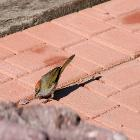

In [26]:
image